In [59]:
!pip install torch diffusers transformers tqdm torchvision matplotlib

In [60]:
import os
import torch
import PIL
from PIL import Image
from diffusers import StableDiffusionPipeline, DiffusionPipeline
from transformers import CLIPFeatureExtractor, CLIPTextModel, CLIPTokenizer
import numpy as np
import cv2
from diffusers import AutoencoderKL, LMSDiscreteScheduler, UNet2DConditionModel
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
import torchvision.transforms as T
elastic_transformer = T.ElasticTransform(alpha=550.0,sigma=5.0)
import gc
import torch.nn.functional as F

Configure the PyTorch device and model parameters:
- Sets the device to 'cuda' if CUDA is available, otherwise 'mps' if Metal Performance Shaders are available, falling back to 'cpu'
- Defines image dimensions: height and width both set to 512
- Sets guidance scale to 8
- Configures inference steps to 50
- Sets batch size to 1

In [61]:
torch_device        = "cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu"
height, width       = 512, 512
guidance_scale      = 8
loss_scale          = 200
num_inference_steps = 50
batch_size          = 1

Check the `torch.device`, which returns 'cuda' indicating the code is running on a NVIDIA GPU.

In [62]:
torch_device

'cuda'

Load a pre-trained Stable Diffusion model:
- Uses the `CompVis/stable-diffusion-v1-4` model
- Creates a DiffusionPipeline instance with float16 precision
- Moves the model to the specified device (cuda in this case)

In [63]:
pretrained_model_name_or_path = "CompVis/stable-diffusion-v1-4"
pipe = DiffusionPipeline.from_pretrained(
    pretrained_model_name_or_path,
    torch_dtype=torch.float16
).to(torch_device)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [64]:
def image_grid(imgs, rows, cols):
    """
    This function:
    - Creates a grid of images for display
    - Takes a list of images and arranges them in a specified number of rows and columns
    - Returns a single combined image grid
    """
    assert len(imgs) == rows*cols
    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

def image_loss(images,loss_type):
    """
    This function:
    - Implements different types of loss functions for image processing:
      - 'blue': Calculates loss based on the blue channel of images
      - 'elastic': Applies elastic transformation and calculates loss
      - 'symmetry': Computes symmetry-based loss using flipped images
      - 'saturation': Calculates loss based on saturation adjustments
    - Returns the computed error/loss value
    """
    if loss_type == 'blue':
        # blue loss
        error = torch.abs(images[:,2] - 0.9).mean() # [:,2] -> all images in batch, only the blue channel
    elif loss_type == 'elastic':
        # elastic loss
        transformed_imgs = elastic_transformer(images) # 2,3,512,512
        error = torch.abs(transformed_imgs - images).mean()
    elif loss_type == 'symmetry':
        flipped_image = torch.flip(images, [3])
        error = F.mse_loss(images, flipped_image)
    elif loss_type == 'saturation':
        # saturation loss
        transformed_imgs = T.functional.adjust_saturation(images,saturation_factor = 10)
        error = torch.abs(transformed_imgs - images).mean()
    else:
        print("error. Loss not defined")

    return error

def latents_to_pil(latents):
    """
    This function:
    - Converts latent space representations to PIL images
    - Processes the latents through several transformations:
      - Decoding
      - Normalization
      - Format conversion
    - Returns a list of PIL images
    """
    # bath of latents -> list of images
    latents = (1 / 0.18215) * latents
    with torch.no_grad():
        image = pipe.vae.decode(latents).sample
    image = (image / 2 + 0.5).clamp(0, 1) # 0 to 1
    image = image.detach().cpu().permute(0, 2, 3, 1).numpy()
    images = (image * 255).round().astype("uint8")
    pil_images = [Image.fromarray(image) for image in images]
    return pil_images

In [65]:
def generate_image(seed_no,prompts,loss_type,loss_apply=False):
    """
    This function is a comprehensive image generation function 
    that implements the stable diffusion process.
    """

    # -> Initialization and Setup
    # Initializes a random number generator with the given seed
    generator           = torch.manual_seed(seed_no)

    # Sets up an LMSDiscreteScheduler with specific beta parameters and timesteps
    scheduler    = LMSDiscreteScheduler(beta_start = 0.00085, beta_end = 0.012, beta_schedule = "scaled_linear", num_train_timesteps = 1000)
    scheduler.set_timesteps(num_inference_steps)
    scheduler.timesteps = scheduler.timesteps.to(torch.float32)

    # -> Text Processing
    # Processes input prompts using a tokenizer
    text_input = pipe.tokenizer(prompts, padding='max_length', max_length = pipe.tokenizer.model_max_length, truncation= True, return_tensors="pt")
    input_ids = text_input.input_ids.to(torch_device)

    # Converts text inputs to embeddings using the pipeline's text encoder
    with torch.no_grad():
        text_embeddings = pipe.text_encoder(text_input.input_ids.to(torch_device))[0]

    # Handle padding and truncation of text inputs
    max_length = text_input.input_ids.shape[-1]
    uncond_input = pipe.tokenizer(
          [""] * batch_size, padding="max_length", max_length= max_length, return_tensors="pt"
    )

    with torch.no_grad():
        uncond_embeddings = pipe.text_encoder(uncond_input.input_ids.to(torch_device))[0]

    # Concatenates unconditioned and text embeddings
    text_embeddings = torch.cat([uncond_embeddings,text_embeddings]) # 2,77,768

    # -> Latent Space Generation
    # Creates random initial latents based on model configuration
    latents = torch.randn(
        (batch_size, pipe.unet.config.in_channels, height// 8, width //8),
        generator = generator,
    ) .to(torch.float16)


    # Moves latents to the appropriate device (GPU/CPU)
    latents = latents.to(torch_device)
    # Applies noise scaling based on the scheduler
    latents = latents * scheduler.init_noise_sigma

    # -> Diffusion Process
    # Implements a loop over timesteps for the diffusion process
    # For each timestep
    for i, t in tqdm(enumerate(scheduler.timesteps), total = len(scheduler.timesteps)):

        # Processes the latent model input
        latent_model_input = torch.cat([latents] * 2)
        sigma = scheduler.sigmas[i]
        latent_model_input = scheduler.scale_model_input(latent_model_input, t)

        with torch.no_grad():
            noise_pred = pipe.unet(latent_model_input.to(torch.float16), t, encoder_hidden_states=text_embeddings)["sample"]
            #noise_pred = pipe.unet(latent_model_input, t, encoder_hidden_states=text_embeddings)["sample"]

        # Applies noise prediction
        noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
        noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

        # Handles gradient computation if loss is applied
        if loss_apply and i%5 == 0:

            latents = latents.detach().requires_grad_()
            #latents_x0 = scheduler.step(noise_pred,t, latents).pred_original_sample # this line does not work
            latents_x0 = latents - sigma * noise_pred

            # use vae to decode the image
            denoised_images = pipe.vae.decode((1/ 0.18215) * latents_x0).sample / 2 + 0.5 # range(0,1)

            # Applies specified loss functions if requested
            loss = image_loss(denoised_images,loss_type) * loss_scale
            print(f"loss {loss}")

            # Computes gradients for optimization if needed
            cond_grad = torch.autograd.grad(loss, latents)[0]
            latents = latents.detach() - cond_grad * sigma**2

        # Updates latents using the scheduler
        latents = scheduler.step(noise_pred,t, latents).prev_sample

    # Returns the final latents
    return latents

In [66]:
# Load SD (Stable Diffusion) concepts
sdconcepts = ['', '', '', ' ', '']

# Loads several textual inversion concepts from the SD concepts library
pipe.load_textual_inversion("sd-concepts-library/dreams", mean_resizing=False)
pipe.load_textual_inversion("sd-concepts-library/midjourney-style", mean_resizing=False)
pipe.load_textual_inversion("sd-concepts-library/moebius", mean_resizing=False)
pipe.load_textual_inversion("sd-concepts-library/style-of-marc-allante", mean_resizing=False)
pipe.load_textual_inversion("sd-concepts-library/wlop-style", mean_resizing=False)

# Define seeds
seed_list = [3000,2000,1000,900,200]

In [67]:
# specify your prompt
prompt  = """A realistic image of Boy with a cowboy hat in the style of"""
#prompt  = """Nazy German soldier in the style of"""
#prompt  = """A rugged soldier in full combat gear, standing on a battlefield at dusk, dramatic lighting, highly detailed, cinematic style in the style of"""
#prompt = """Rabbit in a spacesuit in the style of"""
#prompt = """A realistic image of Rabbit in a spacesuit in the style of"""

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

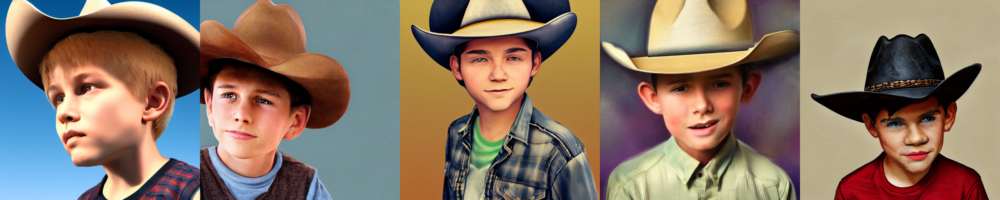

In [68]:
# Image Generation Loop
latents_collect = [] # Initializes an empty latents collection
loss_type = 'N/A'
for seed_no,sd in zip(seed_list,sdconcepts):

    # Clear the CUDA cache
    torch.cuda.empty_cache()
    gc.collect()
    torch.cuda.empty_cache()

    # Generates images using the defined prompt
    prompts = [f'{prompt} {sd}']
    latents = generate_image(seed_no, prompts,loss_type,loss_apply=False)
    latents_collect.append(latents)

# Collects and stacks generated latents
latents_collect = torch.vstack(latents_collect)
# Converts latents to PIL images
images = latents_to_pil(latents_collect)
# Creates an image grid from the results
image_grid(images, 1, len(latents_collect))

  0%|          | 0/50 [00:00<?, ?it/s]

loss 9.4375
loss 24.25
loss 21.84375
loss 19.890625
loss 19.4375
loss 19.8125
loss 19.453125
loss 20.453125
loss 19.875
loss 19.984375


  0%|          | 0/50 [00:00<?, ?it/s]

loss 8.59375
loss 10.3671875
loss 10.171875
loss 10.1875
loss 9.109375
loss 9.8125
loss 9.8359375
loss 9.9296875
loss 10.640625
loss 10.6484375


  0%|          | 0/50 [00:00<?, ?it/s]

loss 7.6484375
loss 8.9453125
loss 9.9765625
loss 8.7734375
loss 9.65625
loss 9.5078125
loss 9.5390625
loss 9.921875
loss 10.171875
loss 10.84375


  0%|          | 0/50 [00:00<?, ?it/s]

loss 7.99609375
loss 8.9453125
loss 11.5546875
loss 9.9921875
loss 9.9765625
loss 10.9765625
loss 9.96875
loss 11.2734375
loss 11.0078125
loss 11.2578125


  0%|          | 0/50 [00:00<?, ?it/s]

loss 9.359375
loss 8.6875
loss 10.171875
loss 11.8125
loss 11.015625
loss 10.3046875
loss 9.734375
loss 9.5
loss 9.9453125
loss 10.90625


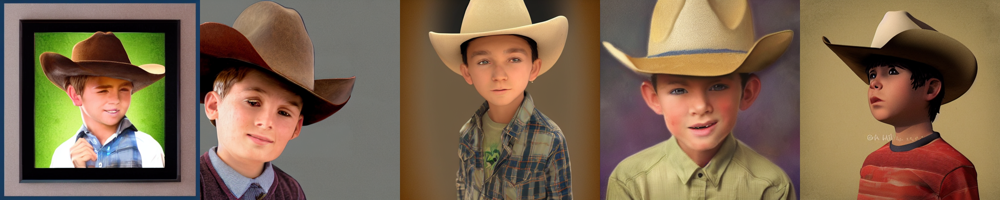

In [69]:
# Image Generation Loop applying elastic loss
latents_collect = [] # Initializes an empty latents collection
loss_type = 'elastic'
for seed_no,sd in zip(seed_list,sdconcepts):

    # Clear the CUDA cache
    torch.cuda.empty_cache()
    gc.collect()
    torch.cuda.empty_cache()

    # Generates images using the defined prompt
    prompts = [f'{prompt} {sd}']
    latents = generate_image(seed_no,prompts,loss_type,loss_apply=True)
    latents_collect.append(latents)

# Collects and stacks generated latents
latents_collect = torch.vstack(latents_collect)
# Converts latents to PIL images
images = latents_to_pil(latents_collect)
# Creates an image grid from the results
image_grid(images, 1, len(latents_collect))

  0%|          | 0/50 [00:00<?, ?it/s]

loss 4.37109375
loss 68.5625
loss 48.78125
loss 33.03125
loss 29.203125
loss 27.125
loss 25.296875
loss 24.734375
loss 24.40625
loss 24.25


  0%|          | 0/50 [00:00<?, ?it/s]

loss 33.90625
loss 33.96875
loss 23.15625
loss 16.84375
loss 13.8046875
loss 12.015625
loss 11.4921875
loss 10.9296875
loss 10.703125
loss 10.6015625


  0%|          | 0/50 [00:00<?, ?it/s]

loss 2.724609375
loss 4.875
loss 8.765625
loss 8.609375
loss 5.1953125
loss 4.8359375
loss 5.0703125
loss 5.421875
loss 5.6484375
loss 6.109375


  0%|          | 0/50 [00:00<?, ?it/s]

loss 12.3046875
loss 60.40625
loss 34.125
loss 18.71875
loss 14.328125
loss 11.875
loss 11.515625
loss 11.4296875
loss 10.8671875
loss 10.765625


  0%|          | 0/50 [00:00<?, ?it/s]

loss 5.23828125
loss 22.515625
loss 5.953125
loss 4.31640625
loss 4.82421875
loss 4.91796875
loss 5.0
loss 5.07421875
loss 5.09375
loss 5.125


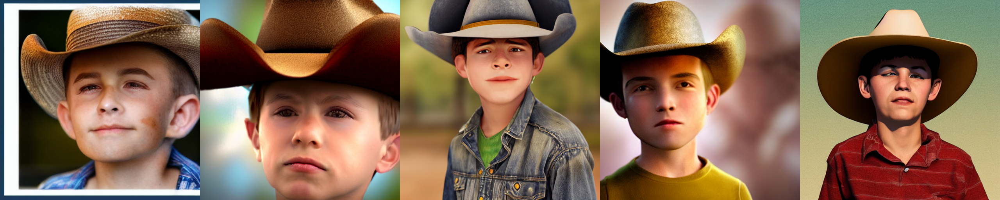

In [70]:
# Image Generation Loop applying symmetry loss
latents_collect = [] # Initializes an empty latents collection
loss_type = 'symmetry'
for seed_no,sd in zip(seed_list,sdconcepts):

    # Clear the CUDA cache
    torch.cuda.empty_cache()
    gc.collect()
    torch.cuda.empty_cache()

    # Generates images using the defined prompt
    prompts = [f'{prompt} {sd}']
    latents = generate_image(seed_no,prompts,loss_type,loss_apply=True)
    latents_collect.append(latents)

# Collects and stacks generated latents
latents_collect = torch.vstack(latents_collect)
# Converts latents to PIL images
images = latents_to_pil(latents_collect)
# Creates an image grid from the results
image_grid(images, 1, len(latents_collect))

  0%|          | 0/50 [00:00<?, ?it/s]

loss 55.125
loss 49.65625
loss 43.875
loss 32.875
loss 30.9375
loss 27.984375
loss 26.953125
loss 26.375
loss 26.078125
loss 25.953125


  0%|          | 0/50 [00:00<?, ?it/s]

loss 54.4375
loss 39.875
loss 30.171875
loss 25.21875
loss 21.234375
loss 18.8125
loss 17.453125
loss 16.734375
loss 16.65625
loss 16.5625


  0%|          | 0/50 [00:00<?, ?it/s]

loss 54.9375
loss 46.25
loss 40.65625
loss 35.0
loss 32.75
loss 30.5
loss 29.328125
loss 28.953125
loss 28.78125
loss 28.78125


  0%|          | 0/50 [00:00<?, ?it/s]

loss 58.34375
loss 36.3125
loss 33.21875
loss 27.21875
loss 25.609375
loss 23.1875
loss 21.0
loss 20.078125
loss 19.9375
loss 20.078125


  0%|          | 0/50 [00:00<?, ?it/s]

loss 52.09375
loss 40.46875
loss 33.34375
loss 22.6875
loss 21.796875
loss 19.625
loss 18.78125
loss 18.421875
loss 18.109375
loss 17.875


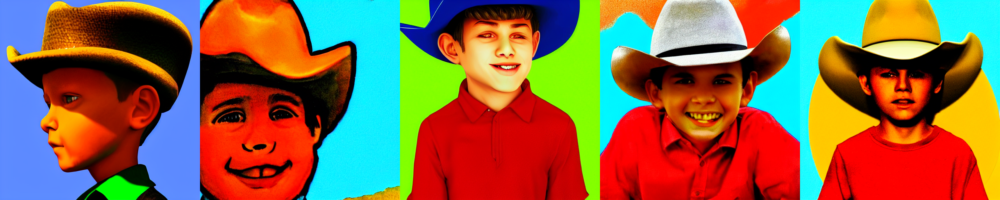

In [71]:
# Image Generation Loop applying saturation loss
latents_collect = [] # Initializes an empty latents collection
loss_type = 'saturation'
for seed_no,sd in zip(seed_list,sdconcepts):

    # Clear the CUDA cache
    torch.cuda.empty_cache()
    gc.collect()
    torch.cuda.empty_cache()

    # Generates images using the defined prompt
    prompts = [f'{prompt} {sd}']
    latents = generate_image(seed_no,prompts,loss_type,loss_apply=True)
    latents_collect.append(latents)

# Collects and stacks generated latents
latents_collect = torch.vstack(latents_collect)
# Converts latents to PIL images
images = latents_to_pil(latents_collect)
# Creates an image grid from the results
image_grid(images, 1, len(latents_collect))

  0%|          | 0/50 [00:00<?, ?it/s]

loss 92.0625
loss 54.34375
loss 38.4375
loss 26.828125
loss 28.296875
loss 27.15625
loss 26.203125
loss 25.5625
loss 24.921875
loss 24.53125


  0%|          | 0/50 [00:00<?, ?it/s]

loss 115.625
loss 40.125
loss 30.25
loss 27.25
loss 23.515625
loss 21.578125
loss 21.03125
loss 20.796875
loss 20.671875
loss 20.671875


  0%|          | 0/50 [00:00<?, ?it/s]

loss 139.5
loss 20.125
loss 25.640625
loss 17.53125
loss 13.328125
loss 11.5703125
loss 10.78125
loss 10.1171875
loss 9.296875
loss 8.5859375


  0%|          | 0/50 [00:00<?, ?it/s]

loss 106.9375
loss 32.34375
loss 28.390625
loss 24.3125
loss 19.9375
loss 18.046875
loss 17.265625
loss 16.875
loss 16.5
loss 16.15625


  0%|          | 0/50 [00:00<?, ?it/s]

loss 118.5625
loss 36.875
loss 31.84375
loss 30.734375
loss 30.21875
loss 28.953125
loss 27.8125
loss 27.046875
loss 26.734375
loss 26.6875


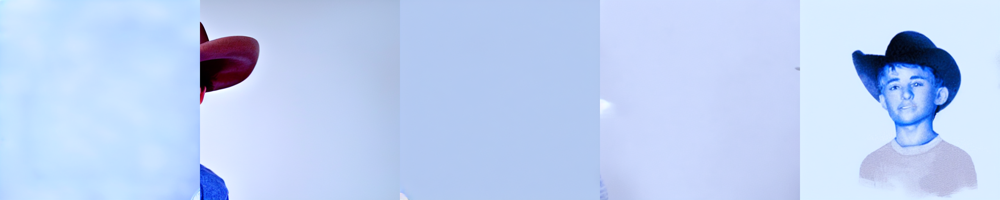

In [72]:
# Image Generation Loop applying blue loss
latents_collect = [] # Initializes an empty latents collection
loss_type = 'blue'
for seed_no,sd in zip(seed_list,sdconcepts):

    # Clear the CUDA cache
    torch.cuda.empty_cache()
    gc.collect()
    torch.cuda.empty_cache()

    # Generates images using the defined prompt
    prompts = [f'{prompt} {sd}']
    latents = generate_image(seed_no,prompts,loss_type,loss_apply=True)
    latents_collect.append(latents)

# Collects and stacks generated latents
latents_collect = torch.vstack(latents_collect)
# Converts latents to PIL images
images = latents_to_pil(latents_collect)
# Creates an image grid from the results
image_grid(images, 1, len(latents_collect))